In [100]:
pwd

'/kaggle/working'

In [101]:
import matplotlib.pyplot as plt
import os
import pandas as pd

In [102]:
print(os.listdir('/kaggle/input/tomato'))

['valid', 'train']


In [103]:
data='/kaggle/input/tomato/train'
val_path='/kaggle/input/tomato/valid'

In [104]:
# count = 0
# for root, folders, filenames in os.walk('/kaggle/input/tomato'):
#    print(root, folders)

In [105]:
categories = []
train = []
valid = []
test = []

folders = os.listdir('/kaggle/input/tomato/train')
for f in folders:
    categories.append(f)
    train_count = len(os.listdir(os.path.join('/kaggle/input/tomato/train', f)))
    train.append(train_count)
    test.append(int(train_count * 0.2))

folders = os.listdir('/kaggle/input/tomato/valid')
for f in folders:
    valid.append(len(os.listdir(os.path.join('/kaggle/input/tomato/valid', f))))

data_count = pd.DataFrame({'categories': categories,
                           'train': train,
                           'valid': valid,
                           'test': test                     
                          })

print(data_count)

                              categories  train  valid  test
0                            Late_blight   3113    792   622
1          Tomato_Yellow_Leaf_Curl_Virus   2039    498   407
2                     Septoria_leaf_spot   2882    746   576
3                           Early_blight   2455    643   491
4   Spider_mites Two-spotted_spider_mite   1747    435   349
5                         powdery_mildew   1004    252   200
6                                healthy   3051    805   610
7                         Bacterial_spot   2826    732   565
8                            Target_Spot   1827    457   365
9                    Tomato_mosaic_virus   2153    584   430
10                             Leaf_Mold   2754    739   550


In [106]:
#@title Creating Training DataFrame
def create_df(path):
  data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
     data.append(['/kaggle/input/tomato/train/' + folder + '/' + file, folder.split('-')[-1]])
  return pd.DataFrame(data,columns=['filename','label'])

In [107]:
df=create_df(data)

In [108]:
#@title Creating Validation DataFrame
def create_validation_df(path):
  validation_data=[]
  for folder in os.listdir(path):
    for file in os.listdir(os.path.join(path,folder)):
      validation_data.append(['/kaggle/input/tomato/valid/' + folder + '/'+file,folder.split('-')[-1]])
  return pd.DataFrame(validation_data,columns=['filename','label'])

In [109]:
val_df=create_validation_df(val_path)

In [110]:
from sklearn.model_selection import train_test_split

X = df['filename']
y = df['label']

X_train, X_test, y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)


In [111]:
train_df = pd.DataFrame(X_train)
train_df['label'] = y_train

In [112]:
test_df=pd.DataFrame(X_test)
test_df['label']=y_test

In [113]:
IMG_SIZE = 224
BATCH_SIZE=32
Epochs=64

In [114]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [115]:
import tensorflow as tf

# Data Augmentation pipeline
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomContrast(0.3),
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomZoom(0.3),
    tf.keras.layers.RandomRotation(0.2)
])


In [116]:
# train_datagen = ImageDataGenerator(
#     rescale=1/255.,
#     preprocessing_function=lambda img: data_augmentation(img)
# )
# # train_datagen = ImageDataGenerator(rescale=1/255.)
# test_datagen = ImageDataGenerator(rescale=1/255.)
# val_datagen  = ImageDataGenerator(rescale=1/255.)

In [117]:
train_datagen = ImageDataGenerator(rescale=1/255.)
test_datagen = ImageDataGenerator(rescale=1/255.)
val_datagen  = ImageDataGenerator(rescale=1/255.)

In [118]:
# Create data generators from dataframes
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=32
)

Found 20680 validated image filenames belonging to 11 classes.


In [119]:
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=50,
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col="filename",
    y_col="label",
    target_size=(IMG_SIZE, IMG_SIZE),
    class_mode="categorical",
    batch_size=BATCH_SIZE,
    shuffle=False
)

print(train_generator.class_indices)
print(val_generator.class_indices)
print(test_generator.class_indices)

Found 6683 validated image filenames belonging to 11 classes.
Found 5171 validated image filenames belonging to 11 classes.
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}
{'Bacterial_spot': 0, 'Early_blight': 1, 'Late_blight': 2, 'Leaf_Mold': 3, 'Septoria_leaf_spot': 4, 'Target_Spot': 5, 'Tomato_Yellow_Leaf_Curl_Virus': 6, 'Tomato_mosaic_virus': 7, 'healthy': 8, 'powdery_mildew': 9, 'spotted_spider_mite': 10}


In [120]:
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow import keras

In [121]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adamax
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score 
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [122]:
# from tensorflow.keras.models import Sequential, Model
# from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
# from tensorflow.keras.optimizers import Adamax
# from sklearn.metrics import accuracy_score
# from sklearn.metrics import precision_score 
# from sklearn.metrics import recall_score
# from sklearn.metrics import f1_score
# from keras import regularizers
# from keras.callbacks import EarlyStopping

In [123]:
NUM_CLASSES = 11

In [124]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3), pooling='max')
x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.45)(x)
predictions= Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=Adamax(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,859,595 (91.02 MB)

 Trainable params: 23,802,379 (90.80 MB)

 Non-trainable params: 57,216 (223.50 KB)

In [125]:
# # Input layer
# input_layer = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# # Entry module
# def entry_module(input_layer):
#     # Multi-scale block
#     conv1_1 = layers.Conv2D(24, (7, 7), padding='same', activation='relu')(input_layer)
#     conv1_2 = layers.Conv2D(24, (5, 5), padding='same', activation='relu')(input_layer)
#     conv1_3 = layers.Conv2D(48, (3, 3), padding='same', activation='relu')(input_layer)

#     # Concatenate multi-scale features
#     concatenated = layers.concatenate([conv1_1, conv1_2, conv1_3])

#     # 1x1 convolution to fuse features and reduce complexity
#     fused_features = layers.Conv2D(64, (1, 1), padding='same', activation='relu')(concatenated)
    
#     return fused_features

# # Middle module
# def middle_module(x):
#     # FR Block 1
#     conv3 = layers.Conv2D(64, (5, 5), padding='same', activation='relu')(x)
#     conv4 = layers.Conv2D(96, (1, 1), padding='same', activation='relu')(conv3)
#     pool1 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv4)

#     # FR Block 2
#     conv5 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(pool1)
#     conv6 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(conv5)
#     conv7 = layers.Conv2D(192, (1, 1), padding='same', activation='relu')(conv6)
#     pool2 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv7)

#     # FR Block 3
#     conv8 = layers.Conv2D(96, (3, 3), padding='same', activation='relu')(pool2)
#     conv9 = layers.Conv2D(192, (1, 1), padding='same', activation='relu')(conv8)
#     pool3 = layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(conv9)

#     return pool3

# # Rear module
# def rear_module(x):
#     # Global Average Pooling
#     x = layers.GlobalAveragePooling2D()(x)
#     # Fully connected layer
#     x = layers.Dense(128, activation='relu')(x)
#     # Output layer
#     output = layers.Dense(11, activation='softmax')(x) 
#     return output


# # Building the MFRCNN model
# x = entry_module(input_layer)
# x = middle_module(x)
# output_layer = rear_module(x)

# # Create the model
# model = models.Model(inputs=input_layer, outputs=output_layer)

# # Compile the model
# model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.005, momentum=0.9),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# # Summary of the model
# model.summary()


In [126]:
# steps_per_epoch = len(train_generator) 
# epochs = 20000 // steps_per_epoch

In [127]:
# history = model.fit(
#     train_generator,
#     epochs=epochs,  
#     steps_per_epoch=steps_per_epoch,
#     validation_data=val_generator
# )

In [128]:
history = model.fit(train_generator, 
                    epochs=10, 
                    validation_data= val_generator)

Epoch 1/10


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


286/647 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.5588 - loss: 1.5211

I0000 00:00:1726229595.832665     101 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_add_reduce_fusion_28', 456 bytes spill stores, 456 bytes spill loads



647/647 ━━━━━━━━━━━━━━━━━━━━ 209s 237ms/step - accuracy: 0.6625 - loss: 1.1393 - val_accuracy: 0.0685 - val_loss: 3.8615
Epoch 2/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 122s 188ms/step - accuracy: 0.8895 - loss: 0.3359 - val_accuracy: 0.8537 - val_loss: 0.4807
Epoch 3/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 122s 187ms/step - accuracy: 0.9168 - loss: 0.2540 - val_accuracy: 0.9313 - val_loss: 0.2081
Epoch 4/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 121s 186ms/step - accuracy: 0.9417 - loss: 0.1757 - val_accuracy: 0.8917 - val_loss: 0.3579
Epoch 5/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 122s 188ms/step - accuracy: 0.9497 - loss: 0.1548 - val_accuracy: 0.9535 - val_loss: 0.1519
Epoch 6/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 122s 187ms/step - accuracy: 0.9654 - loss: 0.1040 - val_accuracy: 0.9389 - val_loss: 0.1998
Epoch 7/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 121s 186ms/step - accuracy: 0.9711 - loss: 0.0934 - val_accuracy: 0.9427 - val_loss: 0.1923
Epoch 8/10
647/647 ━━━━━━━━━━━━━━━━━━━━ 143s 187ms/step - accuracy: 0.9792 - loss: 0.06

In [129]:
train_loss,train_acc=model.evaluate(train_generator)

647/647 ━━━━━━━━━━━━━━━━━━━━ 66s 99ms/step - accuracy: 0.9724 - loss: 0.0844


In [130]:
print('Training Accuracy: {:.2f}%'.format(train_acc * 100))
print('Training Loss: {:.2f}'.format(train_loss*100))

Training Accuracy: 97.00%
Training Loss: 8.98


In [131]:
val,acc=model.evaluate(test_generator)

162/162 ━━━━━━━━━━━━━━━━━━━━ 19s 119ms/step - accuracy: 0.9205 - loss: 0.2936


In [132]:
val,acc=model.evaluate(val_generator)

134/134 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - accuracy: 0.9105 - loss: 0.3512


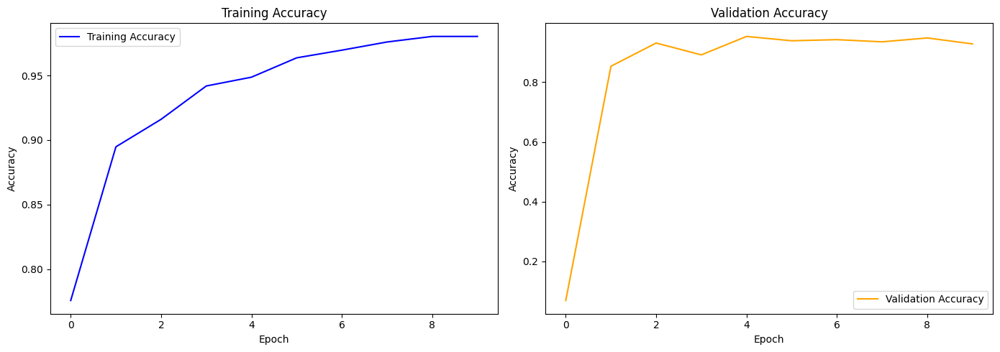

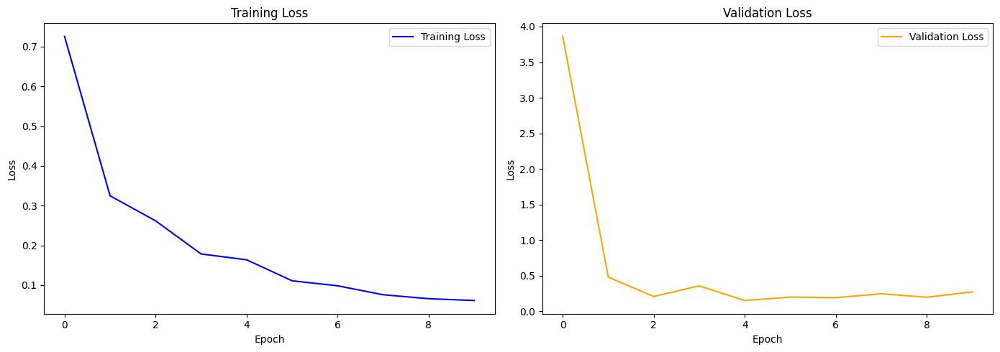

In [133]:
import matplotlib.pyplot as plt
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()


# Plot validation accuracy
plt.subplot(1, 2, 2)
plt.plot(val_accuracy, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


# Plot training and validation loss
plt.figure(figsize=(14, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss', color='blue')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# Plot validation loss
plt.subplot(1, 2, 2)
plt.plot(val_loss, label='Validation Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

162/162 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step


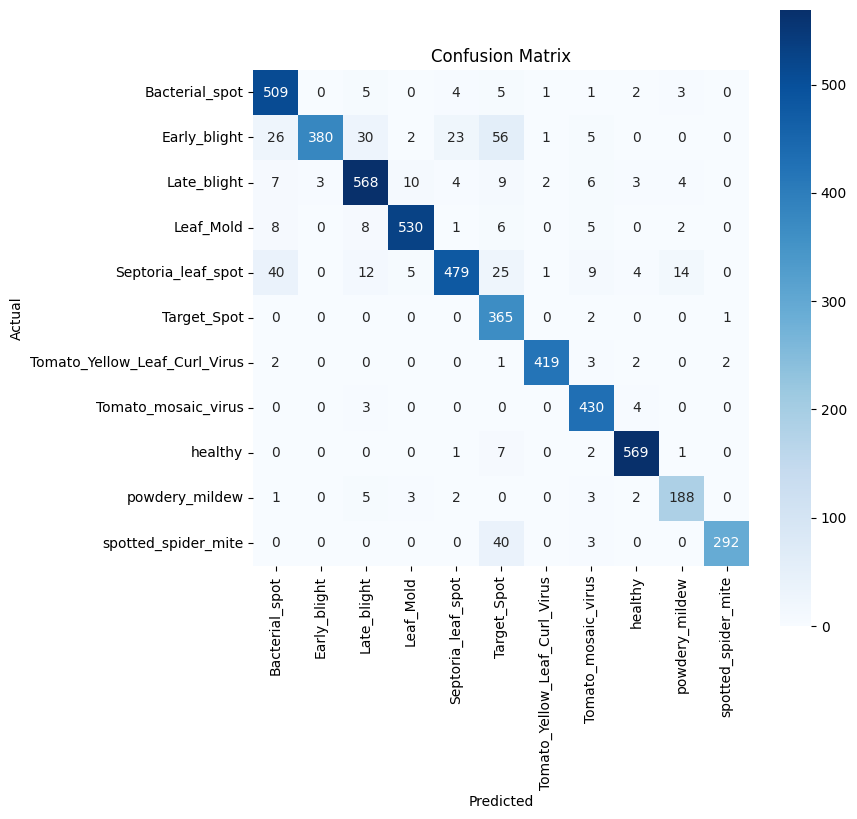

In [134]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Get predictions for the test data
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get true labels for the test data
true_classes = test_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

134/134 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step


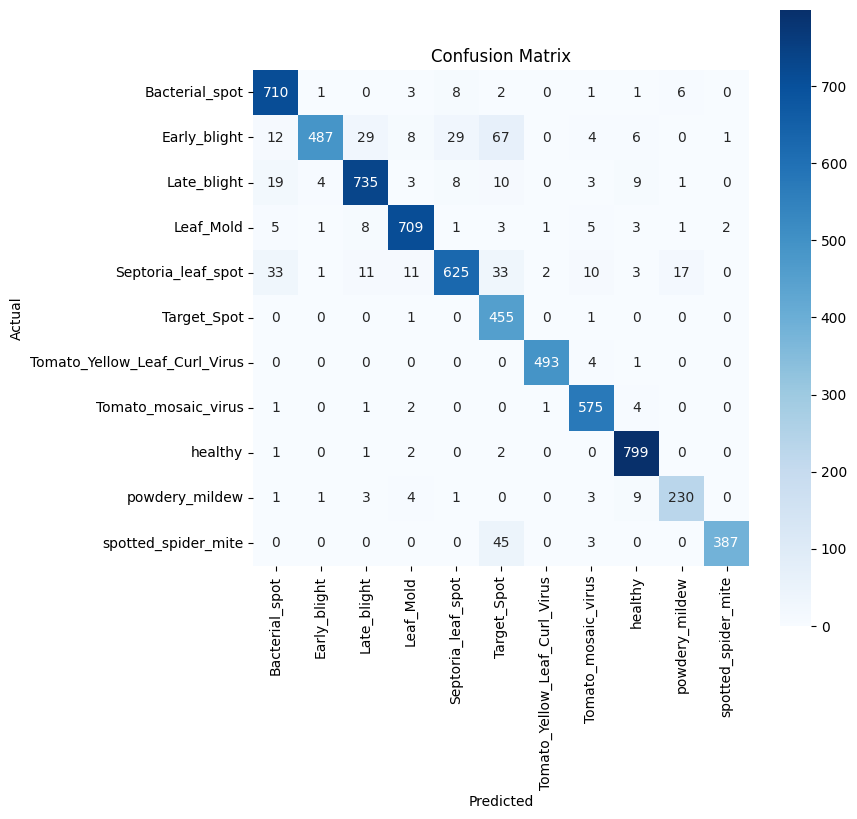

In [135]:
from sklearn.metrics import confusion_matrix
import numpy as np

y_pred = model.predict(val_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

true_classes = val_generator.classes

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, y_pred_classes)

# Plot confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [136]:
precision = precision_score(true_classes, y_pred_classes, average='weighted')
recall = recall_score(true_classes, y_pred_classes, average='weighted')
f1 = f1_score(true_classes, y_pred_classes, average='weighted')
accuracy = accuracy_score(true_classes, y_pred_classes)

# Print metrics
print(f"Precision: {precision}")
print(f"Recall (Sensitivity): {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

Precision: 0.9346983175499848
Recall (Sensitivity): 0.9284752356726022
F1 Score: 0.9282127299495463
Accuracy: 0.9284752356726022


In [137]:
# Calculate overall accuracy
accuracy = accuracy_score(true_classes, y_pred_classes)
print(f"Overall Accuracy: {accuracy*100}")

# Calculate class-wise metrics
precision = precision_score(true_classes, y_pred_classes, average=None)
recall = recall_score(true_classes, y_pred_classes, average=None)
f1 = f1_score(true_classes, y_pred_classes, average=None)

# Get class labels from the generator
class_labels = list(test_generator.class_indices.keys())

# Create a DataFrame to display the results in a table format
metrics_df_MFRCNN = pd.DataFrame({
    'Class': class_labels,
    'Precision': precision,
    'Recall (Sensitivity)': recall,
    'F1 Score': f1
})

Overall Accuracy: 92.84752356726021


In [138]:
metrics_df_MFRCNN

,Class,Precision,Recall (Sensitivity),F1 Score
0,Bacterial_spot,0.907928,0.969945,0.937913
1,Early_blight,0.983838,0.757387,0.855888
2,Late_blight,0.932741,0.928030,0.930380
3,Leaf_Mold,0.954240,0.959405,0.956815
4,Septoria_leaf_spot,0.930060,0.837802,0.881523
5,Target_Spot,0.737439,0.995624,0.847300
6,Tomato_Yellow_Leaf_Curl_Virus,0.991952,0.989960,0.990955
7,Tomato_mosaic_virus,0.944171,0.984589,0.963956
8,healthy,0.956886,0.992547,0.974390
9,powdery_mildew,0.901961,0.912698,0.907298


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


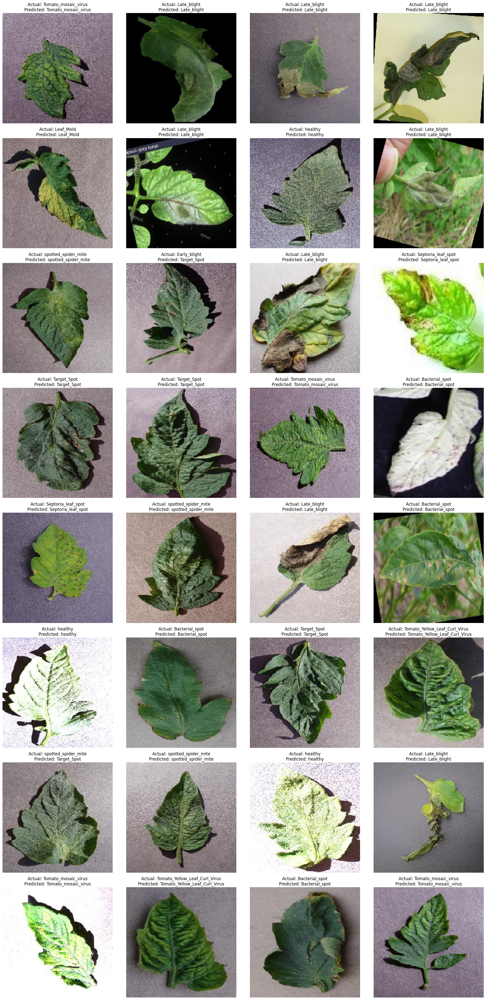

In [139]:
import numpy as np
import matplotlib.pyplot as plt

# Function to display images with predicted and actual labels
def display_predictions(generator, num_images=40):
    images, true_labels = next(generator)
    true_labels = np.argmax(true_labels, axis=1)
    predictions = model.predict(images)
    predicted_labels = np.argmax(predictions, axis=1)
    
    # Number of images actually available in the batch
    actual_num_images = min(num_images, len(images))
    
    plt.figure(figsize=(20, 40))
    
    num_rows = int(np.ceil(actual_num_images / 4))  # Calculate the number of rows needed for 4 columns
    num_cols = 4  # Number of columns
    
    for i in range(actual_num_images):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(images[i])
        plt.title(f"Actual: {class_labels[true_labels[i]]}\nPredicted: {class_labels[predicted_labels[i]]}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display 40 images from the test set with predicted labels
display_predictions(test_generator, num_images=40)


In [140]:
metrics_df_MFRCNN.to_csv('resnet50_individual_class_metrics.csv')

In [141]:
model.save('Tomato_resnet50.h5')

In [142]:
from tensorflow.keras.models import load_model

In [143]:
tomato_model=load_model('Tomato_resnet50.h5')

In [144]:
img_path='/kaggle/input/tomato/valid/Bacterial_spot/014b58ae-091b-408a-ab4a-5a780cd1c3f3___GCREC_Bact.Sp 2971.JPG'

In [145]:
from tensorflow.keras.preprocessing import image
import numpy as np

# Define the target image size
IMG_SIZE = 224

def preprocess_single_image(img_path):
    # Load the image with the target size
    img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    
    # Convert the image to a NumPy array
    img_array = image.img_to_array(img)
    
    # Normalize pixel values to [0, 1] range
    img_array /= 255.0
    # Expand dimensions to match the model's expected input shape
    img_array = np.expand_dims(img_array, axis=0)
    
    return img_array

# Example: Preprocess an image and predict using the model
img_data = preprocess_single_image(img_path)

# Make predictions with the model
predictions = tomato_model.predict(img_data)

# Get the predicted class index
predicted_class = np.argmax(predictions, axis=-1)

# Assuming class labels from your dataset
class_labels = ['Bacterial Spot', 'Early Blight', 'Late Blight','Leaf Mold',
                'Septoria Leaf Spot','Target Spot','Tomato Yellow Leaf Curl Virus',
                'Tomato Mosaic Virus','Healthy','Powdery_Mildew','Spotted Spider Mite' ] 
predicted_class_name = class_labels[predicted_class[0]]

print(f"Predicted class index: {predicted_class[0]}")
print(f"Predicted class name: {predicted_class_name}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted class index: 0
Predicted class name: Bacterial Spot


In [146]:
tomato_model.save_weights('tomato_model-resnet50.weights.h5')